## Pandas analysis

This exercise consists in analyzing a dataset containg timing information from a series of Time-to-Digital-Converters (TDC) implemented in a couple of FPGAs. Each measurement (i.e. each row of the input file) consists of a flag that specifies the type of message ('HEAD', which in this case is always 1), two addresses of the TDC providing the signal ('FPGA' and 'TDC_CHANNEL'), and the timing information ('ORBIT_CNT', 'BX_COUNTER', and 'TDC_MEAS'). Each TDC count corresponds to 25/30 ns, whereas a unit of BX_COUNTER corresponds to 25 ns, and the ORBIT_CNT is increased every 'x' BX_COUNTER. This allows to store the time in a similar way to hours, minutes and seconds.

In [3]:
# If you didn't download it yet, please get the relevant file now!
!wget https://www.dropbox.com/s/xvjzaxzz3ysphme/data_000637.txt -P /home/lorenzo/Programming/CompLab/LaboratoryOfComputationalPhysics_Y4/

--2021-11-30 21:46:14--  https://www.dropbox.com/s/xvjzaxzz3ysphme/data_000637.txt
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.18, 2620:100:6023:18::a27d:4312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/xvjzaxzz3ysphme/data_000637.txt [following]
--2021-11-30 21:46:14--  https://www.dropbox.com/s/raw/xvjzaxzz3ysphme/data_000637.txt
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc4fc53701bc8cdea6720267769a.dl.dropboxusercontent.com/cd/0/inline/Ba_ArGJjL1YtUUZS9QZrMcSwJPebt3IVvlyShl1pJIWDCUoeSL-MjJcZrUrNB4nE9cOUQrNj7ZhI0Tbq398-IBwkUUXec2pDs8W98_0GAdeNWlEuoQWQG9H_TtFWcK2FHXs_NGeiqpKDBWEijRkZYFG5/file# [following]
--2021-11-30 21:46:14--  https://uc4fc53701bc8cdea6720267769a.dl.dropboxusercontent.com/cd/0/inline/Ba_ArGJjL1YtUUZS9QZrMcSwJPebt3IVvlyShl1pJIWDCUoeSL-MjJcZrUrNB4nE9cOUQrNj7ZhI0T

In [4]:
!cat /home/lorenzo/Programming/CompLab/LaboratoryOfComputationalPhysics_Y4/data_000637.txt

HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS
1,0,123,3869200167,2374,26
1,0,124,3869200167,2374,27
1,0,63,3869200167,2553,28
1,0,64,3869200167,2558,19
1,0,64,3869200167,2760,25
1,0,63,3869200167,2762,4
1,0,61,3869200167,2772,14
1,0,139,3869200167,2776,0
1,0,62,3869200167,2774,21
1,0,60,3869200167,2788,7
1,1,7,3869200167,2785,4
1,0,64,3869200167,2786,19
1,1,6,3869200167,2792,18
1,0,36,3869200167,2791,23
1,0,56,3869200167,2789,3
1,1,139,3869200167,2797,0
1,1,8,3869200167,2787,14
1,0,63,3869200167,2790,10
1,1,5,3869200167,2795,4
1,0,53,3869200167,2796,26
1,1,10,3869200167,2789,14
1,0,57,3869200167,2789,10
1,0,61,3869200167,2790,23
1,0,38,3869200167,2799,15
1,0,58,3869200167,2795,19
1,0,62,3869200167,2797,14
1,0,59,3869200167,2799,14
1,0,59,3869200167,3081,21
1,0,61,3869200167,3081,1
1,0,60,3869200167,3083,20
1,0,139,3869200167,3085,0
1,0,62,3869200167,3079,4
1,0,61,3869200167,3085,25
1,0,54,3869200167,3134,4
1,0,53,3869200167,3136,25
1,0,51,3869200167,3146,20
1,0,59,3869200167,3176

1,0,45,3869200344,740,28
1,0,51,3869200344,736,13
1,1,61,3869200344,2124,26
1,0,62,3869200344,2124,15
1,0,54,3869200344,2125,1
1,0,56,3869200344,2125,21
1,1,20,3869200344,2129,5
1,1,65,3869200344,2136,2
1,0,54,3869200344,2131,13
1,0,64,3869200344,2134,0
1,0,58,3869200344,2589,16
1,0,60,3869200344,2595,24
1,0,57,3869200344,2602,1
1,0,2,3869200344,2649,28
1,0,56,3869200344,3024,18
1,0,54,3869200344,3032,7
1,1,22,3869200344,3053,23
1,0,59,3869200344,3053,5
1,1,23,3869200344,3065,28
1,0,62,3869200344,3066,21
1,1,24,3869200344,3067,3
1,1,20,3869200344,3219,22
1,0,64,3869200344,3480,0
1,1,28,3869200345,264,20
1,0,82,3869200345,290,23
1,0,81,3869200345,293,29
1,0,83,3869200345,295,11
1,0,123,3869200345,383,3
1,0,67,3869200345,604,22
1,0,66,3869200345,606,15
1,0,59,3869200345,1022,17
1,0,62,3869200345,1018,20
1,0,139,3869200345,1026,0
1,0,60,3869200345,1024,6
1,0,62,3869200345,1024,10
1,0,57,3869200345,1022,17
1,0,61,3869200345,1030,23
1,0,87,3869200345,1426,7
1,0,49,3869200345,1424,25
1,0,93,

1,0,139,3869200504,224,0
1,1,45,3869200504,227,7
1,0,61,3869200504,217,27
1,1,139,3869200504,229,0
1,1,2,3869200504,221,14
1,1,46,3869200504,228,25
1,0,60,3869200504,222,14
1,1,43,3869200504,238,24
1,0,4,3869200504,362,6
1,1,2,3869200504,380,24
1,1,1,3869200504,382,8
1,1,12,3869200504,384,17
1,1,139,3869200504,391,0
1,1,13,3869200504,384,15
1,1,11,3869200504,389,24
1,1,14,3869200504,389,4
1,0,48,3869200504,691,25
1,0,46,3869200504,694,28
1,0,43,3869200504,982,29
1,0,46,3869200504,985,20
1,1,31,3869200504,992,14
1,0,41,3869200504,993,1
1,0,139,3869200504,997,0
1,0,48,3869200504,995,4
1,0,61,3869200504,1007,22
1,0,62,3869200504,1008,11
1,0,63,3869200504,1008,19
1,0,64,3869200504,1010,27
1,0,64,3869200504,1019,18
1,1,1,3869200504,1046,10
1,0,50,3869200504,1044,11
1,0,47,3869200504,1042,3
1,0,47,3869200504,1050,19
1,0,63,3869200504,1061,24
1,0,56,3869200504,1380,0
1,0,58,3869200504,1380,9
1,0,57,3869200504,1384,1
1,0,62,3869200504,1520,13
1,0,64,3869200504,1523,7
1,0,58,3869200504,1622,2
1

1,1,30,3869200661,1478,28
1,0,60,3869200661,1469,20
1,1,139,3869200661,1482,0
1,1,4,3869200661,1477,14
1,0,123,3869200661,1480,8
1,0,63,3869200661,1476,26
1,1,25,3869200661,1480,21
1,0,51,3869200661,1478,15
1,0,57,3869200661,1473,29
1,0,64,3869200661,1478,27
1,0,58,3869200661,1476,20
1,0,61,3869200661,1480,3
1,0,60,3869200661,1771,10
1,0,51,3869200661,1824,26
1,0,41,3869200661,1827,22
1,0,139,3869200661,1835,0
1,0,51,3869200661,1831,12
1,0,123,3869200661,1836,12
1,0,59,3869200661,1833,0
1,0,42,3869200661,1825,20
1,0,44,3869200661,1833,22
1,0,60,3869200661,1834,4
1,0,62,3869200661,1835,23
1,0,54,3869200661,1835,11
1,0,63,3869200661,1837,17
1,0,64,3869200661,1835,24
1,0,61,3869200661,1837,4
1,1,16,3869200661,2074,26
1,0,64,3869200661,2078,28
1,0,49,3869200661,2080,4
1,0,123,3869200661,2078,11
1,0,63,3869200661,2079,23
1,0,139,3869200661,2082,0
1,0,43,3869200661,2082,7
1,0,124,3869200661,2082,27
1,0,50,3869200661,2080,23
1,0,121,3869200661,2090,16
1,0,63,3869200661,2084,18
1,0,44,38692006

1,0,62,3869200814,3091,0
1,0,50,3869200814,3186,5
1,0,63,3869200814,3194,26
1,0,47,3869200814,3198,2
1,0,64,3869200814,3197,20
1,1,1,3869200814,3338,25
1,0,116,3869200814,3335,17
1,1,2,3869200814,3342,23
1,0,124,3869200814,3339,29
1,0,122,3869200814,3346,28
1,1,4,3869200814,3515,22
1,0,124,3869200814,3523,0
1,0,43,3869200815,2,1
1,0,58,3869200815,5,19
1,0,44,3869200815,7,17
1,0,139,3869200815,12,0
1,0,56,3869200815,11,29
1,0,41,3869200815,10,3
1,0,42,3869200815,14,17
1,0,59,3869200815,417,21
1,1,4,3869200815,419,1
1,0,53,3869200815,418,26
1,0,139,3869200815,420,0
1,0,60,3869200815,418,28
1,1,4,3869200815,426,7
1,0,64,3869200815,422,17
1,0,124,3869200815,429,26
1,0,38,3869200815,426,21
1,0,57,3869200815,420,1
1,0,58,3869200815,417,2
1,0,62,3869200815,430,12
1,0,56,3869200815,428,6
1,0,57,3869200815,428,21
1,1,42,3869200815,456,23
1,0,60,3869200815,431,0
1,1,17,3869200815,463,19
1,0,47,3869200815,1794,19
1,0,48,3869200815,1802,8
1,0,139,3869200815,1808,0
1,0,50,3869200815,1802,17
1,0,45,

1,0,64,3869200970,1185,17
1,0,53,3869200970,1196,10
1,0,57,3869200970,1187,3
1,0,49,3869200970,1396,13
1,0,124,3869200970,1402,3
1,0,51,3869200970,1394,1
1,0,139,3869200970,1406,0
1,0,54,3869200970,1404,9
1,1,52,3869200970,1524,8
1,0,63,3869200970,1529,2
1,0,64,3869200970,1533,5
1,1,14,3869200970,1545,25
1,0,64,3869200970,1546,5
1,1,15,3869200970,1551,20
1,1,139,3869200970,1556,0
1,1,12,3869200970,1556,5
1,0,63,3869200970,1552,8
1,1,13,3869200970,1554,24
1,0,63,3869200970,1557,4
1,0,61,3869200970,1628,13
1,0,17,3869200970,1633,18
1,0,62,3869200970,1628,11
1,1,11,3869200970,1631,10
1,0,139,3869200970,1634,0
1,0,19,3869200970,1631,13
1,1,11,3869200970,1636,1
1,0,20,3869200970,1634,18
1,0,63,3869200970,1630,14
1,1,13,3869200970,1636,12
1,1,8,3869200970,1829,20
1,0,33,3869200970,1828,25
1,1,10,3869200970,1837,11
1,0,36,3869200970,1830,1
1,0,35,3869200970,1841,3
1,1,116,3869200970,1978,11
1,1,1,3869200970,2118,29
1,1,2,3869200970,2130,19
1,0,37,3869200970,2131,9
1,1,1,3869200970,2135,5
1,0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0,62,3869207013,933,9
1,0,60,3869207013,935,2
1,1,25,3869207013,1148,27
1,0,38,3869207013,1148,23
1,1,27,3869207013,1149,16
1,0,57,3869207013,1152,12
1,1,6,3869207013,1150,22
1,0,139,3869207013,1154,0
1,0,62,3869207013,1149,27
1,1,26,3869207013,1155,25
1,0,58,3869207013,1149,25
1,1,139,3869207013,1162,0
1,1,1,3869207013,1154,21
1,0,63,3869207013,1148,25
1,1,24,3869207013,1161,19
1,0,40,3869207013,1160,16
1,1,25,3869207013,1161,4
1,0,59,3869207013,1159,14
1,1,2,3869207013,1156,27
1,0,64,3869207013,1149,29
1,1,4,3869207013,1160,24
1,0,42,3869207013,1160,16
1,0,56,3869207013,1162,0
1,0,61,3869207013,1154,9
1,0,63,3869207013,1343,22
1,1,12,3869207013,1344,28
1,0,56,3869207013,1346,7
1,0,64,3869207013,1344,16
1,0,57,3869207013,1354,14
1,0,139,3869207013,1356,0
1,0,58,3869207013,1354,19
1,0,56,3869207013,1448,13
1,1,5,3869207013,1524,11
1,0,61,3869207013,1528,23
1,0,59,3869207013,1531,14
1,1,6,3869207013,1529,7
1,0,139,3869207013,1532,0
1,0,62,3869207013,1528,9
1,1,139,3869207013,1536,0
1,1,

1,0,80,3869207108,208,7
1,0,43,3869207108,211,7
1,0,139,3869207108,219,0
1,0,82,3869207108,217,2
1,0,33,3869207108,218,5
1,1,2,3869207108,360,5
1,0,48,3869207108,361,11
1,0,56,3869207108,711,23
1,0,56,3869207108,718,25
1,0,60,3869207108,777,24
1,0,44,3869207108,776,8
1,0,57,3869207108,779,25
1,0,139,3869207108,784,0
1,0,41,3869207108,781,7
1,0,43,3869207108,782,24
1,0,59,3869207108,782,4
1,0,42,3869207108,782,27
1,0,58,3869207108,785,2
1,1,81,3869207108,963,12
1,0,44,3869207108,1052,29
1,0,51,3869207108,1057,11
1,0,60,3869207108,1106,0
1,0,63,3869207108,1103,16
1,1,2,3869207108,1113,17
1,0,64,3869207108,1103,28
1,0,61,3869207108,1117,1
1,1,24,3869207108,1187,12
1,0,62,3869207108,1188,6
1,0,56,3869207108,1190,9
1,0,139,3869207108,1198,0
1,0,64,3869207108,1187,22
1,1,23,3869207108,1196,23
1,0,123,3869207108,1201,2
1,0,59,3869207108,1196,28
1,1,26,3869207108,1196,4
1,0,63,3869207108,1191,9
1,0,57,3869207108,1200,17
1,0,61,3869207108,1196,19
1,0,58,3869207108,1199,19
1,0,62,3869207108,1200

1,0,57,3869207159,2649,26
1,0,64,3869207159,2664,27
1,0,72,3869207159,2884,25
1,0,60,3869207159,2931,21
1,0,59,3869207159,2933,10
1,0,63,3869207159,2934,25
1,0,61,3869207159,2944,29
1,0,57,3869207159,2943,11
1,0,139,3869207159,2947,0
1,0,64,3869207159,2943,23
1,0,58,3869207159,2945,2
1,1,6,3869207159,2956,29
1,1,7,3869207159,2956,22
1,1,4,3869207159,2959,6
1,0,44,3869207159,2968,5
1,1,6,3869207159,2966,12
1,0,77,3869207159,3085,3
1,0,58,3869207159,3274,9
1,1,127,3869207159,3467,10
1,0,96,3869207160,127,19
1,0,63,3869207160,457,17
1,1,8,3869207160,457,5
1,1,7,3869207160,461,29
1,1,10,3869207160,469,27
1,0,61,3869207160,579,21
1,0,44,3869207160,577,22
1,0,139,3869207160,585,0
1,0,62,3869207160,582,15
1,0,41,3869207160,582,19
1,0,43,3869207160,583,17
1,0,123,3869207160,592,9
1,0,63,3869207160,587,17
1,0,42,3869207160,589,2
1,0,54,3869207160,590,11
1,0,64,3869207160,585,19
1,0,62,3869207160,738,2
1,0,59,3869207160,744,10
1,0,61,3869207160,742,6
1,0,139,3869207160,750,0
1,0,60,3869207160,74

1,1,14,3869207257,2078,11
1,1,15,3869207257,2082,0
1,0,51,3869207257,2407,24
1,0,54,3869207257,2409,0
1,0,49,3869207257,2413,28
1,1,1,3869207257,2417,27
1,0,3,3869207257,2430,1
1,0,49,3869207257,2441,0
1,0,84,3869207257,2470,2
1,0,82,3869207257,2476,18
1,0,81,3869207257,2535,0
1,0,124,3869207257,2551,0
1,0,64,3869207257,2552,9
1,0,139,3869207257,2553,0
1,0,37,3869207257,2551,14
1,0,35,3869207257,2558,26
1,0,48,3869207257,2550,9
1,1,4,3869207257,2560,28
1,0,36,3869207257,2562,11
1,0,50,3869207257,2551,18
1,1,7,3869207257,2560,23
1,0,63,3869207257,2553,27
1,1,5,3869207257,2558,18
1,0,38,3869207257,2554,6
1,0,44,3869207257,2560,2
1,0,61,3869207257,2558,28
1,0,62,3869207257,2560,24
1,0,63,3869207257,2641,23
1,0,64,3869207257,2642,6
1,0,61,3869207257,2644,7
1,0,139,3869207257,2656,0
1,0,62,3869207257,2654,18
1,0,64,3869207257,2655,4
1,0,28,3869207257,3074,1
1,0,26,3869207257,3083,22
1,0,60,3869207257,3144,27
1,0,123,3869207257,3150,0
1,1,12,3869207257,3189,1
1,1,113,3869207257,3200,16
1,1,3

1,0,45,3869207356,964,4
1,0,57,3869207356,960,3
1,0,64,3869207356,965,19
1,0,47,3869207356,964,18
1,0,64,3869207356,976,16
1,0,61,3869207356,978,13
1,0,62,3869207356,987,19
1,1,113,3869207356,1056,23
1,1,28,3869207356,1204,5
1,0,61,3869207356,1208,16
1,0,64,3869207356,1213,11
1,0,139,3869207356,1222,0
1,0,62,3869207356,1214,4
1,0,10,3869207356,1222,17
1,0,63,3869207356,1220,13
1,0,59,3869207356,1585,11
1,0,60,3869207356,1585,27
1,0,139,3869207356,1594,0
1,0,35,3869207356,1592,4
1,0,61,3869207356,1591,1
1,0,62,3869207356,1592,3
1,0,36,3869207356,1603,3
1,0,63,3869207356,1592,4
1,0,64,3869207356,1593,7
1,0,33,3869207356,1604,25
1,0,63,3869207356,1670,9
1,0,56,3869207356,1677,24
1,0,64,3869207356,1671,5
1,0,61,3869207356,1681,25
1,0,59,3869207356,1862,27
1,0,60,3869207356,1866,26
1,0,139,3869207356,1876,0
1,0,57,3869207356,1874,18
1,0,62,3869207356,1873,23
1,0,40,3869207356,1938,27
1,0,42,3869207356,1949,16
1,0,38,3869207356,2093,8
1,1,1,3869207356,2094,4
1,0,44,3869207356,2094,23
1,1,2,3

1,0,47,3869207429,1225,8
1,1,1,3869207429,1232,20
1,0,59,3869207429,1232,13
1,1,2,3869207429,1235,15
1,0,61,3869207429,1226,7
1,0,45,3869207429,1227,27
1,0,60,3869207429,1234,18
1,0,46,3869207429,1234,1
1,0,64,3869207429,1801,5
1,0,64,3869207429,1814,15
1,0,58,3869207429,1825,23
1,0,139,3869207429,1828,0
1,0,59,3869207429,1826,10
1,0,60,3869207429,1825,4
1,0,57,3869207429,1826,26
1,0,60,3869207429,1836,1
1,0,61,3869207429,1853,28
1,0,57,3869207429,1838,15
1,1,28,3869207429,1860,3
1,0,62,3869207429,1851,6
1,1,26,3869207429,1861,14
1,0,58,3869207429,1839,14
1,1,139,3869207429,1868,0
1,0,59,3869207429,1851,17
1,1,27,3869207429,1864,5
1,0,62,3869207429,1865,4
1,1,25,3869207429,1866,7
1,0,60,3869207429,1851,27
1,0,59,3869207429,1863,1
1,0,60,3869207429,1864,6
1,0,57,3869207429,1918,15
1,0,139,3869207429,1925,0
1,0,47,3869207429,1918,1
1,0,50,3869207429,1926,27
1,0,58,3869207429,1920,24
1,0,48,3869207429,1923,16
1,0,60,3869207429,1926,24
1,1,2,3869207429,2046,20
1,0,33,3869207429,2045,13
1,0

1,0,63,3869207494,1461,6
1,0,59,3869207494,1474,23
1,0,64,3869207494,1462,25
1,0,63,3869207494,1474,17
1,0,63,3869207494,1585,4
1,0,64,3869207494,1586,13
1,0,43,3869207494,1616,5
1,0,78,3869207494,1616,4
1,0,59,3869207494,1736,6
1,1,1,3869207494,1736,17
1,1,4,3869207494,1737,4
1,0,53,3869207494,1742,11
1,1,16,3869207494,1745,21
1,0,60,3869207494,1737,1
1,1,20,3869207494,1742,11
1,0,139,3869207494,1749,0
1,1,89,3869207494,1751,21
1,0,53,3869207494,1747,21
1,1,139,3869207494,1753,0
1,1,2,3869207494,1740,8
1,0,56,3869207494,1738,20
1,1,8,3869207494,1754,9
1,0,48,3869207494,1749,11
1,0,57,3869207494,1737,17
1,0,57,3869207494,1744,13
1,0,58,3869207494,1747,27
1,1,5,3869207494,2076,28
1,1,6,3869207494,2080,15
1,1,139,3869207494,2091,0
1,1,4,3869207494,2085,5
1,0,63,3869207494,2085,23
1,1,3,3869207494,2089,10
1,0,64,3869207494,2087,20
1,1,63,3869207494,2134,29
1,1,64,3869207494,2136,22
1,1,10,3869207494,2152,8
1,1,8,3869207494,2157,4
1,1,11,3869207494,2163,13
1,0,66,3869207494,2202,28
1,0,70,

1,0,139,3869207557,1996,0
1,0,61,3869207557,1994,6
1,0,62,3869207557,1994,8
1,0,80,3869207557,2064,0
1,1,1,3869207557,2065,20
1,0,10,3869207557,2064,14
1,0,51,3869207557,2065,20
1,1,7,3869207557,2067,27
1,0,7,3869207557,2066,24
1,0,58,3869207557,2066,28
1,1,6,3869207557,2072,26
1,0,62,3869207557,2064,26
1,1,1,3869207557,2073,23
1,0,18,3869207557,2072,24
1,0,47,3869207557,2067,22
1,0,139,3869207557,2077,0
1,0,16,3869207557,2076,29
1,0,50,3869207557,2065,19
1,1,5,3869207557,2077,5
1,0,59,3869207557,2065,19
1,0,63,3869207557,2063,26
1,0,60,3869207557,2074,0
1,0,64,3869207557,2066,6
1,0,48,3869207557,2077,21
1,0,49,3869207557,2078,0
1,0,61,3869207557,2075,1
1,0,63,3869207557,2077,25
1,0,64,3869207557,2077,18
1,1,10,3869207557,2284,21
1,1,2,3869207557,2289,16
1,1,1,3869207557,2294,14
1,0,64,3869207557,2291,16
1,1,8,3869207557,2295,29
1,0,53,3869207557,2298,23
1,1,139,3869207557,2300,0
1,1,3,3869207557,2300,27
1,0,139,3869207557,2301,0
1,0,61,3869207557,2294,0
1,1,11,3869207557,2298,2
1,0,63

1,1,6,3869207633,353,11
1,0,56,3869207633,355,25
1,1,3,3869207633,356,18
1,0,62,3869207633,355,0
1,1,4,3869207633,359,23
1,0,59,3869207633,358,21
1,0,64,3869207633,359,27
1,0,60,3869207633,676,25
1,0,123,3869207633,679,7
1,1,1,3869207633,684,23
1,0,21,3869207633,685,24
1,0,57,3869207633,684,3
1,0,139,3869207633,686,0
1,0,47,3869207633,686,3
1,0,22,3869207633,683,27
1,0,50,3869207633,689,21
1,0,24,3869207633,690,14
1,0,58,3869207633,688,21
1,1,12,3869207633,693,22
1,0,19,3869207633,695,0
1,0,23,3869207633,694,24
1,0,61,3869207633,803,28
1,1,20,3869207633,802,29
1,0,59,3869207633,803,26
1,0,78,3869207633,805,28
1,0,139,3869207633,807,0
1,0,63,3869207633,803,8
1,0,95,3869207633,810,23
1,0,60,3869207633,805,19
1,0,64,3869207633,803,18
1,0,60,3869207633,812,29
1,0,62,3869207633,808,16
1,0,57,3869207633,813,12
1,0,62,3869207633,816,26
1,0,63,3869207633,812,16
1,1,1,3869207633,902,12
1,1,2,3869207633,903,20
1,1,3,3869207633,907,16
1,1,2,3869207633,915,25
1,1,62,3869207633,956,16
1,0,46,386920

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



10662,2785,0
1,0,63,3869210662,2783,29
1,1,139,3869210662,2788,0
1,1,1,3869210662,2784,13
1,0,57,3869210662,2783,0
1,1,2,3869210662,2783,17
1,0,62,3869210662,2790,7
1,0,53,3869210662,2796,19
1,1,3,3869210662,2786,21
1,0,58,3869210662,2782,16
1,1,5,3869210662,2789,21
1,0,64,3869210662,2790,29
1,0,59,3869210662,2783,9
1,1,3,3869210662,2793,16
1,0,61,3869210662,2790,13
1,1,4,3869210662,2794,29
1,0,58,3869210662,2796,19
1,0,63,3869210662,2795,28
1,1,6,3869210662,2794,2
1,1,3,3869210662,2798,26
1,0,35,3869210662,3271,28
1,0,36,3869210662,3278,29
1,0,38,3869210662,3277,2
1,0,61,3869210662,3376,2
1,0,57,3869210662,3378,14
1,1,1,3869210662,3377,5
1,0,139,3869210662,3382,0
1,1,52,3869210662,3382,12
1,0,62,3869210662,3378,21
1,1,2,3869210662,3380,23
1,0,51,3869210662,3384,9
1,1,54,3869210662,3382,16
1,0,58,3869210662,3379,28
1,0,64,3869210662,3380,3
1,1,128,3869210662,3393,11
1,1,4,3869210662,3393,25
1,0,53,3869210662,3391,18
1,1,139,3869210662,3395,0
1,0,56,3869210662,3381,12
1,0,63,3869210662,

1,0,60,3869210716,1980,27
1,1,139,3869210716,1991,0
1,1,13,3869210716,1989,16
1,0,64,3869210716,1978,29
1,1,10,3869210716,1988,19
1,0,57,3869210716,1985,12
1,1,8,3869210716,1991,28
1,0,61,3869210716,1989,23
1,0,58,3869210716,1988,1
1,0,139,3869210716,2021,0
1,0,47,3869210716,2019,28
1,0,139,3869210716,2027,0
1,0,48,3869210716,2025,5
1,0,50,3869210716,2028,8
1,1,3,3869210716,2296,3
1,1,2,3869210716,2300,28
1,1,4,3869210716,2303,14
1,1,139,3869210716,2309,0
1,1,5,3869210716,2307,24
1,0,112,3869210716,2333,2
1,0,112,3869210716,2343,25
1,1,1,3869210716,2519,12
1,1,2,3869210716,2520,7
1,0,51,3869210716,2569,0
1,0,63,3869210716,2578,21
1,0,139,3869210716,2584,0
1,0,54,3869210716,2582,4
1,0,64,3869210716,2580,23
1,0,49,3869210716,2582,6
1,1,8,3869210716,2756,24
1,0,56,3869210716,2755,23
1,1,8,3869210716,2761,5
1,0,58,3869210716,2760,19
1,0,37,3869210716,2932,18
1,0,28,3869210716,2935,3
1,0,40,3869210716,2931,0
1,0,42,3869210716,2941,29
1,1,12,3869210716,3533,18
1,1,14,3869210716,3537,1
1,0,10

1,0,64,3869210746,69,22
1,0,64,3869210746,263,14
1,0,63,3869210746,266,14
1,0,24,3869210746,314,16
1,0,47,3869210746,403,12
1,0,50,3869210746,406,12
1,0,139,3869210746,412,0
1,0,45,3869210746,404,1
1,0,48,3869210746,410,27
1,0,45,3869210746,413,12
1,1,32,3869210746,628,10
1,0,64,3869210746,632,10
1,0,61,3869210746,634,12
1,0,139,3869210746,638,0
1,0,62,3869210746,636,6
1,0,63,3869210746,634,22
1,0,61,3869210746,702,16
1,0,62,3869210746,704,17
1,1,103,3869210746,715,4
1,1,103,3869210746,721,11
1,0,63,3869210746,716,1
1,1,103,3869210746,728,26
1,0,139,3869210746,754,0
1,1,48,3869210746,752,9
1,0,61,3869210746,754,13
1,0,119,3869210746,752,27
1,1,64,3869210746,755,22
1,0,48,3869210746,752,1
1,0,116,3869210746,760,11
1,1,50,3869210746,758,18
1,0,58,3869210746,755,25
1,1,12,3869210746,763,27
1,0,64,3869210746,754,7
1,0,120,3869210746,763,29
1,0,45,3869210746,752,8
1,0,57,3869210746,760,7
1,0,62,3869210746,761,20
1,0,47,3869210746,761,24
1,0,56,3869210746,766,18
1,0,63,3869210746,761,25
1,1,

1,0,8,3869210790,2549,25
1,1,44,3869210790,2839,14
1,1,56,3869210790,2837,15
1,1,55,3869210790,2847,23
1,0,50,3869210790,3040,26
1,0,63,3869210790,3040,29
1,0,51,3869210790,3041,7
1,0,139,3869210790,3053,0
1,0,58,3869210790,3046,7
1,1,1,3869210790,3053,17
1,0,61,3869210790,3042,4
1,1,2,3869210790,3056,13
1,0,47,3869210790,3046,5
1,0,56,3869210790,3051,23
1,0,61,3869210790,3051,8
1,0,45,3869210790,3055,3
1,0,57,3869210790,3051,20
1,1,48,3869210790,3254,11
1,0,62,3869210790,3249,27
1,0,61,3869210790,3252,9
1,0,59,3869210790,3263,1
1,0,139,3869210790,3266,0
1,0,64,3869210790,3264,4
1,0,101,3869210790,3469,26
1,0,93,3869210790,3471,18
1,0,4,3869210790,3483,6
1,1,6,3869210791,8,5
1,0,61,3869210791,11,20
1,1,16,3869210791,8,24
1,0,62,3869210791,10,7
1,1,17,3869210791,9,5
1,0,47,3869210791,13,20
1,1,139,3869210791,19,0
1,1,4,3869210791,18,11
1,0,139,3869210791,20,0
1,0,50,3869210791,14,18
1,1,7,3869210791,17,8
1,0,64,3869210791,18,6
1,1,15,3869210791,17,15
1,0,48,3869210791,21,14
1,1,5,386921

1,0,123,3869210845,174,24
1,0,36,3869210845,177,0
1,0,40,3869210845,176,6
1,0,139,3869210845,178,0
1,0,27,3869210845,180,18
1,0,44,3869210845,176,16
1,0,122,3869210845,178,0
1,0,54,3869210845,175,27
1,0,124,3869210845,178,22
1,0,29,3869210845,186,17
1,0,56,3869210845,177,6
1,0,36,3869210845,188,6
1,0,41,3869210845,174,8
1,0,36,3869210845,193,18
1,0,43,3869210845,185,21
1,0,40,3869210845,185,14
1,0,61,3869210845,309,27
1,0,8,3869210845,311,2
1,0,106,3869210845,313,28
1,1,12,3869210845,317,0
1,0,139,3869210845,319,0
1,0,63,3869210845,317,20
1,1,10,3869210845,323,24
1,0,48,3869210845,323,26
1,0,38,3869210845,334,19
1,0,40,3869210845,337,27
1,0,60,3869210845,353,26
1,1,7,3869210845,354,21
1,0,62,3869210845,353,7
1,1,139,3869210845,362,0
1,1,20,3869210845,353,9
1,0,59,3869210845,362,18
1,1,5,3869210845,360,9
1,0,139,3869210845,364,0
1,0,61,3869210845,358,17
1,1,8,3869210845,356,27
1,0,60,3869210845,364,12
1,1,6,3869210845,360,13
1,0,64,3869210845,367,10
1,1,8,3869210845,365,17
1,0,59,386921

1,0,63,3869210903,1141,6
1,1,6,3869210903,1145,12
1,0,139,3869210903,1146,0
1,0,32,3869210903,1149,19
1,0,37,3869210903,1145,14
1,1,22,3869210903,1149,0
1,0,46,3869210903,1141,28
1,0,57,3869210903,1144,25
1,0,63,3869210903,1145,12
1,0,58,3869210903,1147,29
1,0,64,3869210903,1144,29
1,0,62,3869210903,1149,20
1,0,59,3869210903,1299,13
1,1,56,3869210903,1299,0
1,0,45,3869210903,1299,4
1,1,2,3869210903,1304,7
1,1,58,3869210903,1304,14
1,0,51,3869210903,1298,23
1,1,3,3869210903,1303,16
1,0,58,3869210903,1302,21
1,1,20,3869210903,1312,8
1,0,139,3869210903,1308,0
1,0,63,3869210903,1301,23
1,1,139,3869210903,1315,0
1,1,4,3869210903,1313,2
1,0,46,3869210903,1303,28
1,1,1,3869210903,1313,6
1,0,49,3869210903,1306,6
1,0,60,3869210903,1306,24
1,0,62,3869210903,1308,10
1,0,47,3869210903,1303,9
1,0,50,3869210903,1307,21
1,0,59,3869210903,1313,14
1,0,61,3869210903,1309,29
1,0,48,3869210903,1306,20
1,0,53,3869210903,1309,15
1,0,49,3869210903,1311,28
1,0,50,3869210903,1473,4
1,0,56,3869210903,1474,20
1,

1,0,48,3869210956,16,0
1,0,139,3869210956,18,0
1,0,43,3869210956,15,3
1,1,11,3869210956,106,24
1,1,12,3869210956,108,18
1,0,53,3869210956,164,24
1,0,56,3869210956,168,18
1,0,54,3869210956,172,4
1,0,139,3869210956,174,0
1,0,59,3869210956,172,10
1,0,60,3869210956,174,23
1,0,61,3869210956,184,16
1,0,62,3869210956,182,3
1,0,44,3869210956,358,26
1,1,112,3869210956,523,6
1,0,42,3869210956,617,28
1,0,44,3869210956,623,6
1,0,43,3869210956,626,21
1,0,139,3869210956,646,0
1,0,40,3869210956,642,19
1,0,86,3869210956,646,18
1,0,38,3869210956,653,0
1,0,87,3869210956,644,7
1,0,88,3869210956,647,26
1,0,85,3869210956,648,4
1,1,11,3869210956,733,28
1,1,10,3869210956,735,27
1,1,11,3869210956,737,21
1,1,12,3869210956,735,9
1,1,10,3869210956,741,8
1,0,61,3869210956,1073,29
1,0,62,3869210956,1073,27
1,0,64,3869210956,1086,25
1,0,104,3869210956,1430,27
1,0,104,3869210956,1435,0
1,0,104,3869210956,1443,5
1,0,113,3869210956,1443,9
1,1,70,3869210956,1552,26
1,1,3,3869210956,1646,27
1,0,24,3869210956,1646,12
1,0

1,1,115,3869211014,806,23
1,1,46,3869211014,963,25
1,0,25,3869211014,964,18
1,0,59,3869211014,963,27
1,1,22,3869211014,965,26
1,0,60,3869211014,964,28
1,1,8,3869211014,968,18
1,0,139,3869211014,966,0
1,1,38,3869211014,970,28
1,0,22,3869211014,964,13
1,1,20,3869211014,965,14
1,1,40,3869211014,969,9
1,0,27,3869211014,963,16
1,1,10,3869211014,969,17
1,0,32,3869211014,970,19
1,0,57,3869211014,977,10
1,1,23,3869211014,971,17
1,1,42,3869211014,975,0
1,0,24,3869211014,972,28
1,0,62,3869211014,977,25
1,1,7,3869211014,975,16
1,1,139,3869211014,1010,0
1,1,106,3869211014,1008,12
1,1,103,3869211014,1016,27
1,1,112,3869211014,1009,20
1,1,1,3869211014,1082,2
1,0,18,3869211014,1394,10
1,0,61,3869211014,1577,19
1,0,51,3869211014,1578,4
1,0,32,3869211014,1579,19
1,0,59,3869211014,1578,0
1,0,58,3869211014,1582,25
1,0,139,3869211014,1584,0
1,0,62,3869211014,1583,7
1,0,123,3869211014,1590,21
1,0,54,3869211014,1584,21
1,0,59,3869211014,1586,6
1,0,61,3869211014,1586,5
1,0,53,3869211014,1590,16
1,0,60,386921

1,1,2,3869211073,738,16
1,1,4,3869211073,748,8
1,0,62,3869211073,767,24
1,0,59,3869211073,777,5
1,0,139,3869211073,774,0
1,0,61,3869211073,773,8
1,0,60,3869211073,778,17
1,0,63,3869211073,772,19
1,0,64,3869211073,771,22
1,1,4,3869211073,792,19
1,0,53,3869211073,794,2
1,0,64,3869211073,788,28
1,0,54,3869211073,792,9
1,0,61,3869211073,789,28
1,0,51,3869211073,798,13
1,0,63,3869211073,789,27
1,0,61,3869211073,800,18
1,0,61,3869211073,952,3
1,1,12,3869211073,952,19
1,1,139,3869211073,962,0
1,1,13,3869211073,957,21
1,0,8,3869211073,957,11
1,1,14,3869211073,954,11
1,1,15,3869211073,960,24
1,0,61,3869211073,991,2
1,0,62,3869211073,992,9
1,0,139,3869211073,1000,0
1,0,63,3869211073,995,15
1,0,51,3869211073,1009,29
1,0,64,3869211073,998,10
1,0,63,3869211073,1020,14
1,0,54,3869211073,1021,6
1,0,64,3869211073,1020,9
1,0,49,3869211073,1023,2
1,0,56,3869211073,1145,23
1,1,10,3869211073,1149,28
1,1,18,3869211073,1144,2
1,0,53,3869211073,1151,0
1,1,11,3869211073,1150,11
1,0,60,3869211073,1147,10
1,1,1

1,1,5,3869211126,721,9
1,1,6,3869211126,717,24
1,0,78,3869211126,997,19
1,1,7,3869211126,1212,19
1,1,6,3869211126,1220,16
1,0,33,3869211126,1214,0
1,0,63,3869211126,1220,18
1,1,8,3869211126,1226,2
1,0,80,3869211126,1565,29
1,0,47,3869211126,1568,1
1,0,79,3869211126,1570,2
1,1,1,3869211126,1575,26
1,0,139,3869211126,1576,0
1,0,46,3869211126,1574,20
1,0,81,3869211126,1572,8
1,1,2,3869211126,1576,27
1,0,27,3869211126,1579,22
1,0,63,3869211126,1575,24
1,0,82,3869211126,1578,5
1,0,29,3869211126,1584,24
1,0,48,3869211126,1573,11
1,0,32,3869211126,1587,6
1,0,64,3869211126,1575,26
1,0,45,3869211126,1579,18
1,0,64,3869211126,1581,21
1,0,58,3869211126,1673,3
1,0,60,3869211126,1675,5
1,0,2,3869211126,1819,25
1,0,104,3869211126,1822,6
1,0,123,3869211126,1824,16
1,0,2,3869211126,1830,7
1,0,124,3869211126,1831,29
1,1,2,3869211126,1871,27
1,0,59,3869211126,2329,14
1,0,62,3869211126,2323,8
1,0,60,3869211126,2328,4
1,0,63,3869211126,2325,18
1,0,58,3869211126,2332,11
1,0,64,3869211126,2325,25
1,0,64,386

1\. Create a Pandas DataFrame reading N rows of the 'data_000637.txt' dataset. Choose N to be smaller than or equal to the maximum number of rows and larger that 10k.

2\. Find out the number of BX in a ORBIT (the value 'x').

3\. Find out how much the data taking lasted. You can either make an estimate based on the fraction of the measurements (rows) you read, or perform this check precisely by reading out the whole dataset.

4\. Create a new column with the absolute time in ns (as a combination of the other three columns with timing information).

5\. Replace the values (all 1) of the HEAD column randomly with 0 or 1.

6\. Create a new DataFrame that contains only the rows with HEAD=1.

7\. Make two occupancy plots (one for each FPGA), i.e. plot the number of counts per TDC channel

8\. Use the groupby method to find out the noisy channels, i.e. the TDC channels with most counts (say the top 3)

9\. Count the number of unique orbits. Count the number of unique orbits with at least one measurement from TDC_CHANNEL=139

### 1)

In [5]:
N=20000
entries=N
import pandas as pd
import numpy as np
df = pd.read_csv("~/Programming/CompLab/LaboratoryOfComputationalPhysics_Y3/data_000637.txt").head(N)
df

,HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS
0,1,0,123,3869200167,2374,26
1,1,0,124,3869200167,2374,27
2,1,0,63,3869200167,2553,28
3,1,0,64,3869200167,2558,19
4,1,0,64,3869200167,2760,25
...,...,...,...,...,...,...
19995,1,0,27,3869200366,2513,29
19996,1,0,63,3869200366,2517,6
19997,1,0,32,3869200366,2519,5
19998,1,0,17,3869200366,2522,21


### 2)

In [6]:
x = df['BX_COUNTER'].max() +1    
x

3564

### 3)

In [7]:
dfh=df[df['ORBIT_CNT']==df['ORBIT_CNT'].max()]
dfm=dfh[dfh['BX_COUNTER']==dfh['BX_COUNTER'].max()]
dfs=dfm[dfm['TDC_MEAS']==dfm['TDC_MEAS'].max()]

dfh1=df[df['ORBIT_CNT']==df['ORBIT_CNT'].min()]
dfm1=dfh1[dfh1['BX_COUNTER']==dfh1['BX_COUNTER'].min()]
dfs1=dfm1[dfm1['TDC_MEAS']==dfm1['TDC_MEAS'].min()]

print(dfs1,"\n",dfs)

tstart=df['ORBIT_CNT'][0]*25*3564+df['BX_COUNTER'][0]*25+df['TDC_MEAS'][0]*25/30
tend=df['ORBIT_CNT'][19998]*25*3564+df['BX_COUNTER'][19998]*25+df['TDC_MEAS'][19998]*25/30
dt=(tend-tstart)/10**9

print("taking the data lasted for about",dt*1310720./df.shape[0],"seconds")

   HEAD  FPGA  TDC_CHANNEL   ORBIT_CNT  BX_COUNTER  TDC_MEAS
0     1     0          123  3869200167        2374        26 
        HEAD  FPGA  TDC_CHANNEL   ORBIT_CNT  BX_COUNTER  TDC_MEAS
19998     1     0           17  3869200366        2522        21
taking the data lasted for about 1.162254471168 seconds


### 4)

In [8]:
tstart=df['ORBIT_CNT'][0]*25*3564+df['BX_COUNTER'][0]*25+df['TDC_MEAS'][0]*25/30
df['ns']=df['ORBIT_CNT']*25*3564+df['BX_COUNTER']*25+df['TDC_MEAS']*25/30-tstart
df

,HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS,ns
0,1,0,123,3869200167,2374,26,0.000000e+00
1,1,0,124,3869200167,2374,27,8.125000e-01
2,1,0,63,3869200167,2553,28,4.476625e+03
3,1,0,64,3869200167,2558,19,4.594125e+03
4,1,0,64,3869200167,2760,25,9.649125e+03
...,...,...,...,...,...,...,...
19995,1,0,27,3869200366,2513,29,1.773438e+07
19996,1,0,63,3869200366,2517,6,1.773446e+07
19997,1,0,32,3869200366,2519,5,1.773451e+07
19998,1,0,17,3869200366,2522,21,1.773460e+07


### 5)

In [9]:
df['HEAD']=np.random.randint(0,2,df.shape[0]) 
df

,HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS,ns
0,1,0,123,3869200167,2374,26,0.000000e+00
1,0,0,124,3869200167,2374,27,8.125000e-01
2,0,0,63,3869200167,2553,28,4.476625e+03
3,0,0,64,3869200167,2558,19,4.594125e+03
4,1,0,64,3869200167,2760,25,9.649125e+03
...,...,...,...,...,...,...,...
19995,0,0,27,3869200366,2513,29,1.773438e+07
19996,0,0,63,3869200366,2517,6,1.773446e+07
19997,0,0,32,3869200366,2519,5,1.773451e+07
19998,0,0,17,3869200366,2522,21,1.773460e+07


### 6)

In [10]:
dfrand=df[df['HEAD'] == 1]
dfrand

,HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS,ns
0,1,0,123,3869200167,2374,26,0.000000e+00
4,1,0,64,3869200167,2760,25,9.649125e+03
7,1,0,139,3869200167,2776,0,1.002831e+04
8,1,0,62,3869200167,2774,21,9.995812e+03
9,1,0,60,3869200167,2788,7,1.033412e+04
...,...,...,...,...,...,...,...
19976,1,0,37,3869200366,1338,10,1.770499e+07
19977,1,0,38,3869200366,1346,23,1.770520e+07
19979,1,0,42,3869200366,1946,26,1.772020e+07
19984,1,0,59,3869200366,1973,19,1.772087e+07


### 7)

In [11]:
df1=df[df["FPGA"]==1]
df0=df[df["FPGA"]==0]
print(df1)
print(df0)
maxchannel = df['TDC_CHANNEL'].max()
minchannel = df['TDC_CHANNEL'].min()
print(maxchannel,minchannel)

       HEAD  FPGA  TDC_CHANNEL   ORBIT_CNT  BX_COUNTER  TDC_MEAS            ns
10        0     1            7  3869200167        2785         4  1.025662e+04
12        0     1            6  3869200167        2792        18  1.044331e+04
15        1     1          139  3869200167        2797         0  1.055331e+04
16        1     1            8  3869200167        2787        14  1.031500e+04
18        1     1            5  3869200167        2795         4  1.050662e+04
...     ...   ...          ...         ...         ...       ...           ...
19933     1     1            1  3869200365        2275         2  1.763930e+07
19936     1     1            2  3869200365        2278        14  1.763939e+07
19951     0     1            1  3869200365        2780        17  1.765194e+07
19954     1     1           20  3869200365        2782        17  1.765199e+07
19956     1     1            2  3869200365        2784        20  1.765204e+07

[6041 rows x 7 columns]
       HEAD  FPGA  TDC_CHAN

Text(0.5, 1.0, 'OCCUPANCY PLOT')

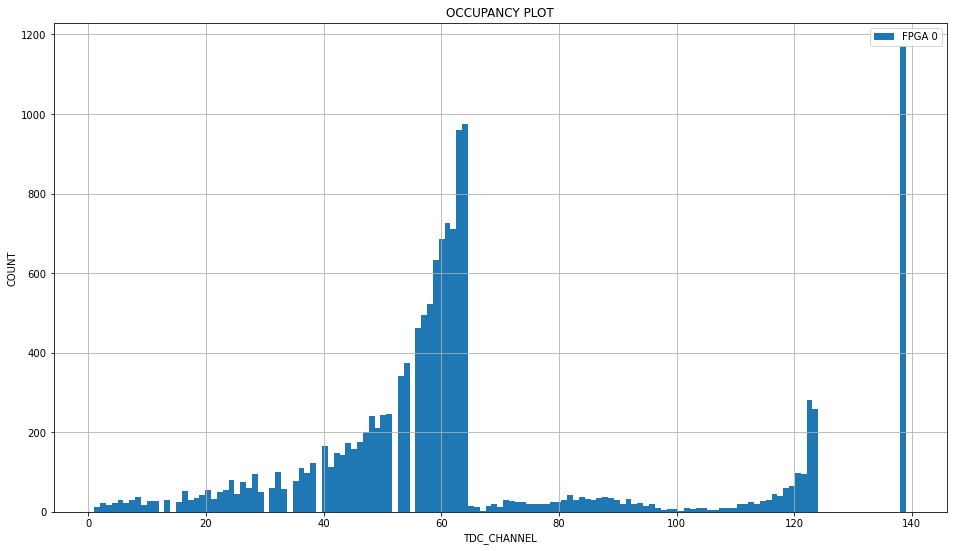

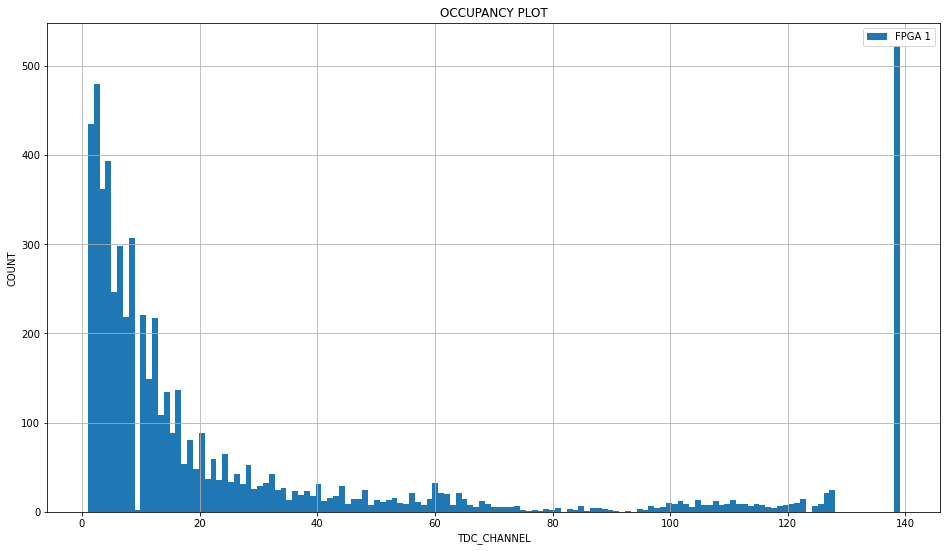

In [12]:
import matplotlib.pyplot as plt
plt.figure(1, figsize=(16, 9))
df0['TDC_CHANNEL'].hist(bins = 139, label = 'FPGA 0')
plt.legend()
plt.xlabel('TDC_CHANNEL')
plt.ylabel('COUNT')
plt.title('OCCUPANCY PLOT')
plt.figure(2, figsize=(16, 9))
df1['TDC_CHANNEL'].hist(bins = 139, label = 'FPGA 1')
plt.legend()
plt.xlabel('TDC_CHANNEL')
plt.ylabel('COUNT')
plt.title('OCCUPANCY PLOT')


### 8)

In [13]:
dfnoise=df.groupby("TDC_CHANNEL").count()
dfnoise

,HEAD,FPGA,ORBIT_CNT,BX_COUNTER,TDC_MEAS,ns
TDC_CHANNEL,,,,,,
1,448,448,448,448,448,448
2,502,502,502,502,502,502
3,379,379,379,379,379,379
4,415,415,415,415,415,415
5,275,275,275,275,275,275
...,...,...,...,...,...,...
125,7,7,7,7,7,7
126,9,9,9,9,9,9
127,21,21,21,21,21,21


### 9)

In [14]:
dfchan139=df[df["TDC_CHANNEL"]==139]
dfchan139

,HEAD,FPGA,TDC_CHANNEL,ORBIT_CNT,BX_COUNTER,TDC_MEAS,ns
7,1,0,139,3869200167,2776,0,1.002831e+04
15,1,1,139,3869200167,2797,0,1.055331e+04
30,1,0,139,3869200167,3085,0,1.775331e+04
39,0,0,139,3869200167,3186,0,2.027831e+04
48,1,0,139,3869200168,23,0,3.030331e+04
...,...,...,...,...,...,...,...
19934,0,0,139,3869200365,2275,0,1.763930e+07
19944,1,0,139,3869200365,2653,0,1.764875e+07
19952,1,0,139,3869200365,2780,0,1.765193e+07
19968,1,0,139,3869200366,682,0,1.768858e+07


In [15]:
dfsingles = df.groupby('ORBIT_CNT')
print('the number of unique orbits is:', len(dfsingles))
dfsingles139 = dfchan139.groupby('ORBIT_CNT')
print('the number of unique orbits counted on tdc_channel 139 is:', len(dfsingles139))

the number of unique orbits is: 200
the number of unique orbits counted on tdc_channel 139 is: 200
